In [1]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from diffusion_utilities import *

In [2]:
# MNIST
from torchvision import datasets, transforms
dataset = datasets.MNIST('~/.pytorch/MNIST_data/', train=True, download=True, transform=transform)

# Setting Things Up

In [3]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[10, 256, 8, 8]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[10, 256, 4,  4]
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample 
            nn.GroupNorm(8, 2 * n_feat), # normalize                        
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]
        
        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)
        
        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)
            
        # embed context and timestep
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


In [4]:
# hyperparameters

# diffusion hyperparameters
timesteps = 1000
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
device = torch.device("mps" if torch.backends.mps.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 10 # context vector is of size 10
height = 28 # 16x16 image
save_dir = './weights_1000/'
chan = 1

# training hyperparameters
batch_size = 128
n_epoch = 20
lrate=1e-4

In [5]:
device

device(type='mps')

In [6]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

In [7]:
# construct model
nn_model = ContextUnet(in_channels=chan, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

# Choose dataset

In [8]:
def first_n (N, mask):
    n = 0
    for i in range(len(mask)):
        if mask[i]:
            n += 1
        if n == N:
            for j in range(i+1, len(mask)):
                mask[j] = False
            break
    return mask

In [9]:
mask_1 = dataset.targets == 0
first_n(100, mask_1)
mask_2 = dataset.targets == 7
first_n(100, mask_2)
mask = mask_1 | mask_2
dataset = torch.utils.data.Subset(dataset, torch.where(mask)[0])


In [10]:
len(dataset)

200

# Training

In [29]:
lrate = 1e-5

In [35]:
dataloader = DataLoader(dataset, batch_size=50, shuffle=True, num_workers=1)
optim = torch.optim.SGD(nn_model.parameters(), lr=lrate, momentum=0.9, nesterov=True)

In [19]:
# helper function: perturbs an image to a specified noise level 
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

#### This code will take hours to run on a CPU. We recommend you skip this step here and check the intermediate results below.
If you decide to try it, you could download to your own machine. Be sure to change the cell type. 
Note, the CPU run time in the course is limited so you will not be able to fully train the network using the class platform.

In [31]:
n_epoch = 30

In [36]:
# training without context code
l_min = 1
# set into train mode
nn_model.train()

for ep in range(n_epoch):
    print(f'epoch {ep+1}')
    
    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
    pbar = tqdm(dataloader, mininterval=2 )
    for x, _ in pbar:   # x: images
        optim.zero_grad()
        x = x.to(device)
        
        # perturb data
        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
        x_pert = perturb_input(x, t, noise)
        
        # use network to recover noise
        pred_noise = nn_model(x_pert, t / timesteps)
        
        # loss is mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        
        optim.step()
    print("Loss = ", loss.item())
    # save model periodically
    if ep%10==0 or ep == int(n_epoch-1) or l_min>loss.item():
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        if l_min>loss.item():
            l_min = loss.item()
        torch.save(nn_model.state_dict(), save_dir + f"collapse_{ep+1}.pth")
        print('saved model at ' + save_dir + f"collapse_{ep+1}.pth")
        

epoch 1


100%|██████████| 4/4 [00:06<00:00,  1.57s/it]


Loss =  0.35642075538635254
saved model at ./weights_1000/collapse_1.pth
epoch 2


100%|██████████| 4/4 [00:05<00:00,  1.42s/it]


Loss =  0.4159228503704071
epoch 3


100%|██████████| 4/4 [00:05<00:00,  1.33s/it]


Loss =  0.41618409752845764
epoch 4


100%|██████████| 4/4 [00:05<00:00,  1.31s/it]


Loss =  0.5092396140098572
epoch 5


100%|██████████| 4/4 [00:05<00:00,  1.41s/it]


Loss =  0.5192652344703674
epoch 6


100%|██████████| 4/4 [00:05<00:00,  1.32s/it]


Loss =  0.39048150181770325
epoch 7


100%|██████████| 4/4 [00:05<00:00,  1.32s/it]


Loss =  0.38657301664352417
epoch 8


100%|██████████| 4/4 [00:05<00:00,  1.45s/it]


Loss =  0.443315714597702
epoch 9


100%|██████████| 4/4 [00:05<00:00,  1.31s/it]


Loss =  0.3068312704563141
saved model at ./weights_1000/collapse_9.pth
epoch 10


100%|██████████| 4/4 [00:05<00:00,  1.30s/it]


Loss =  0.4580599367618561
epoch 11


100%|██████████| 4/4 [00:05<00:00,  1.33s/it]


Loss =  0.2975590229034424
saved model at ./weights_1000/collapse_11.pth
epoch 12


100%|██████████| 4/4 [00:05<00:00,  1.33s/it]


Loss =  0.3537319600582123
epoch 13


100%|██████████| 4/4 [00:05<00:00,  1.32s/it]


Loss =  0.39789965748786926
epoch 14


100%|██████████| 4/4 [00:05<00:00,  1.31s/it]


Loss =  0.5090580582618713
epoch 15


100%|██████████| 4/4 [00:05<00:00,  1.31s/it]


Loss =  0.43331632018089294
epoch 16


100%|██████████| 4/4 [00:05<00:00,  1.30s/it]


Loss =  0.3932501971721649
epoch 17


100%|██████████| 4/4 [00:05<00:00,  1.43s/it]


Loss =  0.38586705923080444
epoch 18


  0%|          | 0/4 [00:01<?, ?it/s]


KeyboardInterrupt: 

# Model

In [11]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load("weights_1000/collapse_43_0308(100).pth", map_location=device))
#nn_model.load_state_dict(torch.load("02_Adam_e-3/MNIST_20.pth", map_location=device))
nn_model.eval() 
print("Loaded in Model without context")

Loaded in Model without context


# Sampling

In [12]:
# helper function; removes the predicted noise (but adds some noise back in to avoid collapse)
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [13]:
# sample using standard algorithm
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, chan, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate ==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [14]:
n_samples = 16

In [15]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(n_samples)
animation_ddpm = plot_sample(intermediate_ddpm,n_samples,2,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

# Collapse

In [15]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 4 * 4, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()

In [16]:
net = Net()
net.load_state_dict(torch.load("./weights/MNIST_Reco.pth"))

<All keys matched successfully>

In [17]:
save_rate = 20

In [18]:
def closest(sam):
    cs = torch.zeros(len(sam))
    sam = sam.view(sam.size(0),-1)
    sam = sam.cpu()
    for i in range(len(dataset)):
        cs = torch.vstack((cs,torch.cosine_similarity(sam, dataset[i][0].view(-1), dim=1)))
    cs = cs[1:]
    #cs is matrix with scores on columns
    return torch.Tensor([torch.argmax(cs[:,j]) for j in range(len(sam))]) #list of closest datapoint to each sample    
    

In [40]:
@torch.no_grad()
def collapse(timesteps):
    fi=dict()
    t_C = []
    for x in range(0,timesteps+1,20):
        fi[x]=0
    
    for o in range (4):
        samples, intermediate = sample_ddpm(25)
        sample_closest = closest(samples)
        t_c = torch.zeros(25, requires_grad= False)
        index = torch.zeros(25, requires_grad= False)

        for step in range(timesteps,-1,-20):
            t_c = torch.zeros(25, requires_grad= False)
            clones = torch.Tensor(intermediate [int(timesteps/save_rate) - int(step/save_rate)]).to(device)
            if step % 100 == 0:
                print(step, "-->", end=" ")

            for i in range(step, 0, -1):
                clones = clones.to(device)
                # reshape time tensor
                t = torch.tensor([i / timesteps])[:, None, None, None].to(device)
                # sample some random noise to inject back in. For i = 1, don't add back in noise
                z = torch.randn_like(clones) if i > 1 else 0
                eps = nn_model(clones, t)    # predict noise e_(x_t,t)
                clones = denoise_add_noise(clones, i, eps, z)
                if step in range(500,701):
                    close = closest(clones)
                    for j in range(25):
                        if close[j] != index[j]:
                            index[j] = close[j]
                            t_c[j] = i
            if step in range (500, 701):
                t_C.append(t_c)
            # Now look at the resulting classes
            clone_closest = closest(clones)
            clones = clones.to(device)
            
        
            fi[step] += int(sum(clone_closest == sample_closest)) 
        print("\n")
        #t_C += torch.sum(t_c)/100

    for x in fi:
        fi[x] /= 100

    return fi, t_C



In [41]:
a, t_C = collapse(timesteps)

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 



In [43]:
step = list(range(1,1001))
beta = dict()
for t in step:
    beta[t] = round(t * 0.0199 / 999 + (0.02 - 0.0199 / 999 * 1000), 15) # beta = at + b
alpha = dict()
alpha[1] = 1 - beta[1]
for t in step[1:]:
    alpha[t] = alpha[t-1] * (1 - beta[t])


In [53]:
import math
T = dict()
for t in step:
    T[t] = -1/2 * math.log(alpha[t])
T[0] = 0

In [78]:
times = []
for x in t_C:
    for y in x:
        try:
            times.append(int(y))
        except:
            print(y)

In [83]:
sum(np.array(times)<400)

940

In [55]:
np.mean(times)

0.2697008724141477

In [56]:
np.mean([sum(t_C[x])/25 for x in range(len(t_C))])

190.90201

In [57]:
import json

# Save dictionary to a JSON file
with open('collapse_3.json', 'w') as json_file:
    json.dump(a, json_file)


In [38]:
import json
# Load dictionary from the JSON file
with open('collapse_3.json', 'r') as json_file:
    b = json.load(json_file)

a = dict()
for x in b:
    a[int(x)] = b[x]

print(a)

{}


In [27]:
N = 1

#Prendine uno ogni N
mask = []
for i in range(len(a)):
    if i%N == 0:
        mask.append(True)
    else:
        mask.append(False)


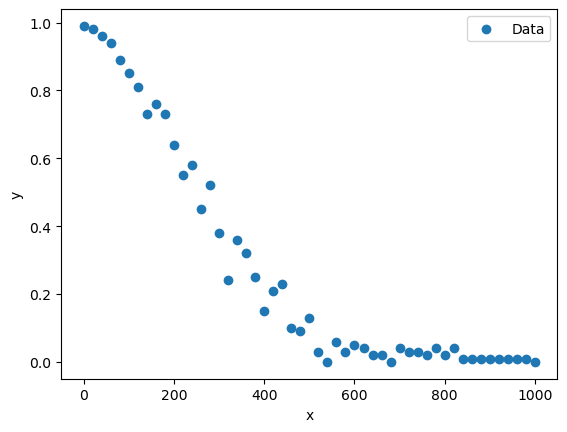

In [28]:
import numpy as np
import matplotlib.pyplot as plt
# Generate example data
new = np.array(list(a.keys()))[mask]
np.random.seed(0)
x_data = np.linspace(0, 1000, len(new))
y_data = np.array([a[x] for x in new]) 

# Plot the original data
plt.scatter(x_data, y_data, label='Data')


plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()


In [83]:
np.mean(times)

0.27821403313331994

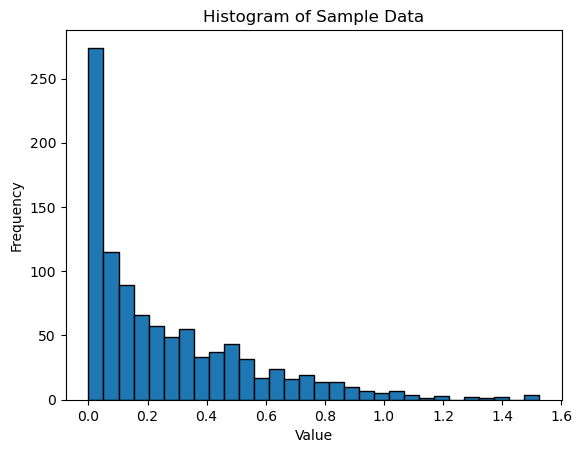

In [71]:
import matplotlib.pyplot as plt
import numpy as np

# Generate sample data
data = np.random.randn(1000)  # 1000 data points from a standard normal distribution

# Create the histogram
plt.hist(times, bins=30, edgecolor='black')  # 30 bins, with black edges around the bars

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Sample Data')

# Show the plot
plt.show()
